In [1]:
import os
import sys
import pickle
import string
import string
import glob
import cv2

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.cluster import AgglomerativeClustering
from matplotlib.animation import FuncAnimation, MovieWriter
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from itertools import product
from matplotlib import ticker

sys.path.append('..')
import massPy as mp
from utils import *
from plot_utils import *
from AnalyseDefects import AnalyseDefects
plt.style.use('sg_article')
plt.rcParams.update({"text.usetex": True,})


In [2]:

def extract_clp_results_single(clustering_dict, act_dir_list, save_path = None):
    """
    Analyse the defects for all the input folders
    """

    Nframes = clustering_dict['Nframes']
  
    # create arrays to store the clustering data
    cluster_arr = np.nan * np.zeros([Nframes, clustering_dict['Nwindows'], 3, clustering_dict['Nact'],])
    nn_arr = np.nan * np.zeros([Nframes, 2, clustering_dict['Nact']])

    for i, act_dir in enumerate(act_dir_list):
        print(i, act_dir)
        cl_res = np.load(os.path.join(act_dir, 'cl_arr.npy'))
        nn_res = np.load(os.path.join(act_dir, 'nn_arr.npy'))
        ff_idx = min(Nframes, cl_res.shape[0])
        cluster_arr[-ff_idx:, :cl_res.shape[1], :, i] = cl_res[-ff_idx:]
        nn_arr[-ff_idx:, :, i] = nn_res[-ff_idx:]

    if save_path is not None:
        if not os.path.isdir(save_path):
            os.makedirs(save_path)
        np.save(os.path.join(save_path, f'clp_arr.npy'), cluster_arr)
        np.save(os.path.join(save_path, f'nn_arr.npy'), nn_arr)
    return cluster_arr

def extract_op_results(Nframes, act_dir_list, LX, calc_sem = False, save_path = None):
    """
    Analyse the defects for all the input folders
    """

    order_param_arr = np.nan * np.zeros([Nframes, 4, len(act_dir_list)])
    normalizer = np.sqrt(LX ** 2) if calc_sem else 1

    for i, act_dir in enumerate(act_dir_list):
        print(i, act_dir)

        op_res = np.load(os.path.join(act_dir, 'order_param_arr.npy'))
        ff_idx = min(Nframes, op_res.shape[0])

        order_param_arr[-ff_idx:, :, i] = op_res[-ff_idx:]
        order_param_arr[-ff_idx:, 1, i] /= normalizer
        order_param_arr[-ff_idx:, 3, i] /= normalizer

    if save_path is not None:
        if not os.path.isdir(save_path):
            os.makedirs(save_path)
        np.save(os.path.join(save_path, f'order_param_arr.npy'), order_param_arr)
    return order_param_arr

def extract_dc_results(Nframes, act_dir_list, save_path = None):
    """
    Analyse the defects for all the input folders
    """

    for i, act_dir in enumerate(act_dir_list):
        print(i, act_dir)

        if i == 0:
            rvals = np.load(os.path.join(act_dir, 'rdf_rad_arr.npy'))
            rdf_arr = np.nan * np.zeros([Nframes, len(rvals), len(act_dir_list)])

        rdf = np.load(os.path.join(act_dir, 'rdf_arr.npy'))
        ff_idx = min(Nframes, rdf.shape[0])

        rdf_arr[-ff_idx:, :, i] = rdf[-ff_idx:]

    if save_path is not None:
        if not os.path.isdir(save_path):
            os.makedirs(save_path)
        np.save(os.path.join(save_path, f'rvals.npy'), rvals)
        np.save(os.path.join(save_path, f'rdf_arr.npy'), rdf_arr)
    return rdf_arr, rvals

def get_defect_arr_from_frame(defect_dict, return_charge = False):
    """
    Convert dictionary of defects to array of defect positions
    Parameters:
    -----------
    defect_dict : dict
        Dictionary of defects positions and charges
    return_charge : bool
        If True, return defect charges as well

    Returns:
    --------
    defect_positions : np.ndarray
        Array of defect positions
    defect_charges : np.ndarray
    """

    Ndefects = len(defect_dict)
    if Ndefects == 0:
        return None
    
    defect_positions = np.empty([Ndefects, 3 if return_charge else 2])

    for i, defect in enumerate(defect_dict):
        if return_charge:
            defect_positions[i,:] = *defect['pos'], defect['charge']
        else:
            defect_positions[i,:] = *defect['pos'],
    return defect_positions

def arg_func(arr, r_max_list, cutoff):
    if np.any(arr == cutoff):
        return r_max_list[np.argwhere(arr == cutoff)[0][0]]
    else:
        return -1
    
def arg_func_idx(arr, cutoff):
    if np.any(arr == cutoff):
        return np.argwhere(arr == cutoff)[0][0]
    else:
        return -1

def arg_func2(arr, cutoff):
    if np.any(arr == cutoff):
        return arr[np.argwhere(arr == cutoff)[0][0]]
    else:
        return -1
    
def get_defect_density(defect_list, area, return_charges=False, save_path = None,):
        """
        Get defect density for each frame in archive
        parameters:
            defect_list: list of lists of dictionaries holding defect charge and position for each frame 
            area: Area of system
            return_charges: if True, return list of densities of positive and negative defects
        returns:
            dens_defects: array of defect densities (Nframes, 3) if return_charges is True else (Nframes, 2)
        """

        if return_charges:
            # Initialize list of defect densities
            dens_pos_defects = []
            dens_neg_defects = []
            for defects in defect_list:
                # Get no. of defects
                nposdef = len([d for d in defects if d['charge'] == 0.5])
                nnegdef = len([d for d in defects if d['charge'] == -0.5])

                dens_pos_defects.append(nposdef / area)
                dens_neg_defects.append(nnegdef / area)

            if save_path is not None:
                np.savetxt(save_path + '_pos', dens_pos_defects)
                np.savetxt(save_path + '_neg', dens_neg_defects)
            return dens_pos_defects, dens_neg_defects
        else:
            dens_defects = []
            for defects in defect_list:
                # Get no. of defects
                ndef = len(defects)
                dens_defects.append(ndef / area)
            if save_path is not None:
                np.savetxt(save_path, dens_defects)
            return dens_defects

def find_conv_time(def_arr, act_list, out_path, fig_path, ninfo, LX, mode='fwd', plot_density = False, \
                   stationarity_dict = dict(interval_len = 20, Njump = 20, Nconverged = -100, max_sigma_dist = 1)):

    Nframes, Nact = def_arr.shape
    conv_list = np.zeros(Nact)

    ncols=3
    nrows = np.ceil(Nact / ncols).astype(int)
    fig, ax = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12, 3*nrows))
    ax = ax.flatten()


    for i, act in enumerate(act_list):

            normalizer = LX ** 2 if plot_density else 1
            vals = def_arr[:, i] / normalizer

            av = np.mean(vals)
        

            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                x = est_stationarity(vals, **stationarity_dict)[0]

            conv_list[i] = x
            ax[i].plot(np.arange(0, Nframes * ninfo, ninfo), vals, '.',
                        alpha = .5, markersize=9, label = rf'$dQ$ = {act}')
        
            if x > 0:
                ax[i].axvline(x * ninfo, color='black', linestyle='--', alpha=0.5)
            ax[i].set_ylim([0, 2 * av])
            ax[i].legend()  
            ax[i].grid(True)


    fig.supxlabel('Time')
    fig.supylabel('Number of defects')


    np.save(os.path.join(out_path, 'conv_list.npy'), conv_list)
    fig.savefig(os.path.join(fig_path, f'num_defects_{mode}{LX}.png'))

    # close figure
    plt.close(fig)
    return

def calc_lmax_lperc(clp_arr, rmax_list, act_list, conv_list, save_path, uncertainty_multiplier = 1, nmin_frames = 20):
    

    lmax_av = np.nan * np.zeros((len(act_list), 2))
    lperc_av = np.nan * np.zeros((len(act_list), 2))

    arg_func1d = lambda arr: arg_func(arr, rmax_list, cutoff = 1)
    lmax_arr = np.apply_along_axis(arg_func1d, axis=1, arr=clp_arr[:, :, -1, :,])
    lperc_arr = np.apply_along_axis(arg_func1d, axis=1, arr=clp_arr[:, :, 0, :,])

    for i, _ in enumerate(act_list):
        ff_idx = int(conv_list[i])

        mask = (lmax_arr[ff_idx:, i,] > 0)
        nsamples = mask.sum()
        if nsamples > nmin_frames:
            arr_res = lmax_arr[ff_idx:, i,][mask]
            lmax_av[i,0] = np.nanmean(arr_res)
            lmax_av[i,1] = np.nanstd(arr_res, ddof = 1,) / np.sqrt(nsamples / uncertainty_multiplier)


        mask_perc = (lperc_arr[ff_idx:, i,] > 0)
        nsamples_perc = mask_perc.sum()
        if nsamples_perc  > nmin_frames:
            arr_res_perc = lperc_arr[ff_idx:, i,][mask_perc]
            lperc_av[i,0] = np.nanmean(arr_res_perc)
            lperc_av[i,1] = np.nanstd(arr_res_perc, ddof = 1,) / np.sqrt(nsamples_perc / uncertainty_multiplier)

    np.save(os.path.join(save_path, 'lmax_arr.npy'), lmax_arr)
    np.save(os.path.join(save_path, 'lperc_arr.npy'), lperc_arr)
    np.save(os.path.join(save_path, 'lmax_av.npy'), lmax_av)
    np.save(os.path.join(save_path, 'lperc_av.npy'), lperc_av)
    return

def calc_nn_avg(nn_arr, def_arr, act_list, conv_list, LX, \
                uncertainty_multiplier = 1, weighted=False, \
                normalize = True, nmin_samples = 20, 
                save_path = None):
    
    nn_av = np.nan * np.zeros((len(act_list), 2))

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        for j in range(len(act_list)):
            ff_idx = int(conv_list[j])
            normalizer = LX / np.sqrt(def_arr[ff_idx:,j]) if normalize else 1
            
            if (nn_arr[:,0,j] > 0).sum() >=  nmin_samples:
                if weighted:
                    nn_av[j] = calc_weighted_mean_vec(nn_arr[ff_idx:,0,j] / normalizer, 
                                                                nn_arr[ff_idx:,1,j] / normalizer, replace_null_uncertainties=True)[:2]
                    nn_av[j,1] *= np.sqrt(uncertainty_multiplier)
                else:
                    nn_av[j,0] = np.nanmean(nn_arr[ff_idx:,0,j] / normalizer)
                    nn_av[j,1] = np.nanstd(nn_arr[ff_idx:,0,j] / normalizer, ddof = 1,) \
                        / np.sqrt(nn_arr[ff_idx:,0,j].size / uncertainty_multiplier)           
    if save_path is not None:
        if not os.path.isdir(save_path):
            os.makedirs(save_path)
        np.save(os.path.join(save_path, 'nn_av.npy'), nn_av)
    return nn_av

def calc_dc_avg(rdf_arr, act_list, conv_list, \
                uncertainty_multiplier = 1, njump=5,
                save_path = None):
    

    
    rdf_arr_av = np.nan * np.zeros((len(act_list), 2, rdf_arr.shape[1]))
  
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        for j in range(len(act_list)):
            ff_idx = int(conv_list[j] / njump)
            rdf_arr_res = rdf_arr[ff_idx:,:,j]
            #nan_mask = np.isnan(rdf_arr_res)
            #rdf_arr_res = rdf_arr_res[~nan_mask]

            rdf_arr_av[j,0,:] = np.nanmean(rdf_arr_res, axis=0)
            rdf_arr_av[j,1,:] = np.nanstd(rdf_arr_res, axis=0, ddof = 1,) \
                / np.sqrt(rdf_arr_res.size / uncertainty_multiplier)        
    if save_path is not None:
        if not os.path.isdir(save_path):
            os.makedirs(save_path)
        np.save(os.path.join(save_path, 'rdf_arr_av.npy'), rdf_arr_av)
    return rdf_arr_av

def calc_order_param_avg(order_param_arr, act_list, conv_list, \
                uncertainty_multiplier = 1, weighted=False, \
                save_path = None):
    
    order_param_av = np.nan * np.zeros((len(act_list), 4))

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        for j in range(len(act_list)):
            ff_idx = int(conv_list[j])
   
            if weighted:
                order_param_av[j, :2] = calc_weighted_mean_vec(order_param_arr[ff_idx:,0,j], 
                                                            order_param_arr[ff_idx:,1,j] * np.sqrt(uncertainty_multiplier))[:2]
                order_param_av[j, 2:] = calc_weighted_mean_vec(order_param_arr[ff_idx:,2,j], 
                                                            order_param_arr[ff_idx:,3,j] * np.sqrt(uncertainty_multiplier))[:2]
                order_param_av[j,1] *= np.sqrt(uncertainty_multiplier)
                order_param_av[j,3] *= np.sqrt(uncertainty_multiplier)
            else:
                order_param_av[j,0] = np.nanmean(order_param_arr[ff_idx:,0,j])
                order_param_av[j,1] = np.nanstd(order_param_arr[ff_idx:,0,j], ddof = 1,) \
                    / np.sqrt(order_param_arr[ff_idx:,0,j].size / uncertainty_multiplier)           
                order_param_av[j,2] = np.nanmean(order_param_arr[ff_idx:,2,j])
                order_param_av[j,3] = np.nanstd(order_param_arr[ff_idx:,2,j], ddof = 1,) \
                    / np.sqrt(order_param_arr[ff_idx:,2,j].size / uncertainty_multiplier)           
    if save_path is not None:
        if not os.path.isdir(save_path):
            os.makedirs(save_path)
        np.save(os.path.join(save_path, 'order_param_av.npy'), order_param_av)
    return order_param_av
        
def plot_order_param(order_param_arr, act_list, Nframes, ninfo, \
                    act_idx_exclude_list = [], lambda_val=None, save_path=None, \
                    ylim = None, mode = 'wet', direction = 'fwd'):
    
    fig, ax = plt.subplots()

    direction = 'forward' if direction == 'fwd' else 'backward'

    for j in range(len(act_list)):
        if j in act_idx_exclude_list: continue

        xvals = np.arange(0, Nframes * ninfo, ninfo)
        ax.plot(xvals, order_param_arr[:,0,j], '.-', label  = f'{act_list[j]}', alpha = .5)
    ax.set_xlabel('Time step')
    ax.set_ylabel('Order parameter (S)')

    ax.legend(ncols=7, loc='upper right',fontsize=12)   
    ax.set_title(rf' $\lambda = ${lambda_val} ({direction})' if mode == 'wet' else rf'Dry ({direction})')
    if ylim is not None:
        ax.set_ylim(ylim)

    fig.tight_layout()  

    if save_path is not None:
        fig.savefig(save_path)
    return fig, ax

def plot_order_param_double(order_param_arr, act_list, idx_lower, Nframes, ninfo, \
                    act_idx_exclude_list = [], lambda_val=None, save_path=None, \
                    ylim_list = None, mode = 'wet', direction = 'fwd'):
    
    fig, ax = plt.subplots(ncols=2, figsize=(12, 6))
    for j in range(len(act_list)):
        if j in act_idx_exclude_list: continue
        ff_idx = 0
        ax[0 if j<idx_lower else 1].plot(order_param_arr[:,0,j], label  = f'{act_list[j]}')
    fig.supxlabel('Time step')
    fig.supylabel('Order parameter (S)')
    fig.suptitle(rf' $\lambda = ${lambda_val} ({direction})' if mode == 'wet' else rf'Dry ({direction})')
    fig.tight_layout()

    for i, axx in enumerate(ax):
        axx.set_ylim([-.05, .25]) if ylim_list is None else axx.set_ylim(ylim_list[i])
        axx.legend(ncol=4, loc='upper right', fontsize=12)

    if save_path is not None:
        fig.savefig(save_path)
    return fig, ax


In [145]:
LX = 256
mode = 'dryvl' 
calc_order_param_sem = False
save_figs = True
letter_subfigs = True

extract = False
extract_op, extract_dc = False, False
extract_def, find_conv = False, False
analyze= False

nmin_frames = 10 #if #mode == 'wet' else 5
uncertainty_multiplier = 20
njump_between_frames = 5
weighted = True

ext_fwd=False

if mode == 'wet':
    folder_name = 'diff_lambda_periodic'
    lambda_list = [0,]# 1] # [0.1, 0.5, 0.8]#1] #1]
    subdir_name = 'wet'
elif mode == 'dry':
    folder_name = 'dry_periodic_long'
    lambda_list = [1,]
    subdir_name = 'dry'
elif mode == 'dryvl':
    folder_name = 'dry_periodic_vl'
    lambda_list = [1,]
    subdir_name = 'dry'
elif mode == 'ac':
    folder_name = 'ac_periodic'
    lambda_list = [0,1]
    subdir_name = 'wet'

out_path_all = f'C:\\Users\\Simon Andersen\\Projects\\Projects\\Thesis\\NematicAnalysis\\data\\passive\\{folder_name}\{mode}\\na{LX}'
defect_position_dir = f'C:\\Users\\Simon Andersen\\Projects\\Projects\\Thesis\\NematicAnalysis\\data\\passive'
figpath_article='C:\\Users\\Simon Andersen\\Documents\\Uni\\PhD\\Research\\Defect Unbinding\\Figs'

for lambda_val in lambda_list:

    base_path_fwd = f'Z:\\defect_unbinding\\{folder_name}\\{subdir_name}\\na{LX}\\{lambda_val}\\fwd'
    base_path_bck = f'Z:\\defect_unbinding\\{folder_name}\\{subdir_name}\\na{LX}\\{lambda_val}\\bck'

    out_path_main = os.path.join(out_path_all, f'{lambda_val}') #if mode == 'wet' else out_path_all
    out_path_fwd = os.path.join(out_path_main, 'fwd')
    out_path_bck = os.path.join(out_path_main, 'bck')
    fig_path = os.path.join(out_path_main, 'figs')

    if extract or extract_def or extract_op or extract_dc:
        if not os.path.isdir(fig_path):
            os.makedirs(fig_path)
        if not os.path.isdir(out_path_main):
            os.makedirs(out_path_main)
        if not os.path.isdir(out_path_fwd):
            os.makedirs(out_path_fwd)
        if not os.path.isdir(out_path_bck):
            os.makedirs(out_path_bck)

        print(f'Analyzing {mode} with lambda = {lambda_val}')
        t1 = time.perf_counter()    

        act_dirs_fwd = [os.path.join(base_path_fwd, x) for x in os.listdir(base_path_fwd)]
        act_dirs_bck = [os.path.join(base_path_bck, x) for x in os.listdir(base_path_bck)] 

        if extract_def:
            base_path_defects_fwd = f'Z:\\defect_unbinding\\{folder_name}\\{subdir_name}\\na{LX}\\{lambda_val}\\defect_positions\\fwd'
            base_path_defects_bck = f'Z:\\defect_unbinding\\{folder_name}\\{subdir_name}\\na{LX}\\{lambda_val}\\defect_positions\\bck'
            act_dirs_def_fwd = [os.path.join(base_path_defects_fwd, x) for x in os.listdir(base_path_defects_fwd)]
            act_dirs_def_bck = [os.path.join(base_path_defects_bck, x) for x in os.listdir(base_path_defects_bck)]

        act_fwd = [float(x.split('-')[-2]) for x in os.listdir(base_path_fwd)]
        act_bck = [float(x.split('-')[-2]) for x in os.listdir(base_path_bck)]

        # save activity list
        np.save(os.path.join(out_path_fwd, 'act_fwd.npy'), act_fwd)
        np.save(os.path.join(out_path_bck, 'act_bck.npy'), act_bck)
    else:
        act_fwd = np.load(os.path.join(out_path_fwd, 'act_fwd.npy'))
        act_bck = np.load(os.path.join(out_path_bck, 'act_bck.npy'))

    act_exclude_fwd = []
    act_exclude_bck = []

    Nact_fwd = len(act_fwd)
    Nact_bck = len(act_bck)
    Nact_list = [Nact_fwd, Nact_bck]

    rmax_list = np.arange(1, int(LX / np.sqrt(2))) 
    Nframes = 1000 #if mode=='wet' #else 50
    Nwindows = len(rmax_list)
    ninfo = 1000

    cluster_dict_fwd = dict(LX = LX, Nframes = Nframes, \
                        Nact = len(act_fwd), \
                        Nwindows = len(rmax_list), \
                        path = out_path_fwd, suffix = '_fwd')
    cluster_dict_bck = dict(LX = LX, Nframes = Nframes, \
                        Nact = len(act_bck), \
                        Nwindows = len(rmax_list), \
                        path = out_path_bck, suffix = '_bck')
    
    if extract_def:
            def_arr_fwd = np.zeros([Nframes, Nact_fwd])
            def_arr_bck = np.zeros([Nframes, Nact_bck])

            for i, (act_dir_list, arr) in enumerate(zip([act_dirs_def_fwd, act_dirs_def_bck], [def_arr_fwd, def_arr_bck])):
                print("Extracting defects for", 'fwd' if i == 0 else 'bck')
                for j, act_dir in enumerate(act_dir_list):
                    print(j)
                    path = os.path.join(act_dir, 'defect_positions.pkl')
                    with open(path, 'rb') as f:
                        defect_dict = pickle.load(f)
                    def_list_pos = get_defect_density(defect_dict, area = 1)
                    ff_idx = min(Nframes, len(def_list_pos))
                    arr[-ff_idx:, j] = def_list_pos[-ff_idx:]

            # save 
            np.save(os.path.join(out_path_fwd, 'def_arr.npy'), def_arr_fwd)
            np.save(os.path.join(out_path_bck, 'def_arr.npy'), def_arr_bck)
    if extract:
        clp_arr_fwd = extract_clp_results_single(cluster_dict_fwd, act_dirs_fwd, save_path=out_path_fwd)
        clp_arr_bck = extract_clp_results_single(cluster_dict_bck, act_dirs_bck, save_path=out_path_bck)
    else:
        clp_arr_fwd = np.load(os.path.join(out_path_fwd, 'clp_arr.npy'))
        clp_arr_bck = np.load(os.path.join(out_path_bck, 'clp_arr.npy'))
        def_arr_fwd = np.load(os.path.join(out_path_fwd, 'def_arr.npy'))
        def_arr_bck = np.load(os.path.join(out_path_bck, 'def_arr.npy'))
        nn_arr_fwd = np.load(os.path.join(out_path_fwd, 'nn_arr.npy'))
        nn_arr_bck = np.load(os.path.join(out_path_bck, 'nn_arr.npy'))
    if extract_op:
        order_param_arr_fwd = extract_op_results(Nframes, act_dirs_fwd, LX, calc_sem=calc_order_param_sem, save_path=out_path_fwd)
        order_param_arr_bck = extract_op_results(Nframes, act_dirs_bck, LX, calc_sem=calc_order_param_sem, save_path=out_path_bck)
    else:
        try:
            order_param_arr_fwd = np.load(os.path.join(out_path_fwd, 'order_param_arr.npy'))
            order_param_arr_bck = np.load(os.path.join(out_path_bck, 'order_param_arr.npy'))
        except:
            pass
    if extract_dc:
        rdf_arr_fwd, rvals_fwd = extract_dc_results(Nframes, act_dirs_fwd, save_path=out_path_fwd)
        rdf_arr_bck, rvals_bck = extract_dc_results(Nframes, act_dirs_bck, save_path=out_path_bck)
    else:
        try:
            rdf_arr_fwd = np.load(os.path.join(out_path_fwd, 'rdf_arr.npy'))
            rdf_arr_bck = np.load(os.path.join(out_path_bck, 'rdf_arr.npy'))
            rvals_fwd = np.load(os.path.join(out_path_fwd, 'rvals.npy'))
            rvals_bck = np.load(os.path.join(out_path_bck, 'rvals.npy'))
        except:
            pass
    if not find_conv:
        try:
            conv_list_fwd = np.load(os.path.join(out_path_fwd, 'conv_list.npy'))
            conv_list_bck = np.load(os.path.join(out_path_bck, 'conv_list.npy'))
        except:
            conv_list_bck = np.zeros(Nact_bck)
            conv_list_fwd = np.zeros(Nact_fwd)
    else:
        block_size = 20 #if mode=='wet' else 5
        Nconverged = 5*block_size
        find_conv_time(def_arr_fwd, act_fwd, out_path_fwd, fig_path, ninfo, LX, mode='fwd', plot_density = False, \
                stationarity_dict = dict(interval_len = block_size, Njump = block_size, Nconverged = Nconverged, max_sigma_dist = 1))
        find_conv_time(def_arr_bck, act_bck, out_path_bck, fig_path, ninfo, LX, mode='bck', plot_density = False, \
                stationarity_dict = dict(interval_len = block_size, Njump = block_size, Nconverged = Nconverged, max_sigma_dist = 1))
    if analyze:
        print(f'Analyzing {mode} lambda=', lambda_val) 
        
        
        calc_lmax_lperc(clp_arr_fwd, rmax_list, act_fwd, conv_list_fwd, out_path_fwd, \
                        uncertainty_multiplier = uncertainty_multiplier/5 if Nframes<100 else uncertainty_multiplier, \
                            nmin_frames = nmin_frames)
        calc_lmax_lperc(clp_arr_bck, rmax_list, act_bck, conv_list_bck, out_path_bck, \
                        uncertainty_multiplier = uncertainty_multiplier/5 if Nframes<100 else uncertainty_multiplier, \
                            nmin_frames = nmin_frames)
        calc_nn_avg(nn_arr_fwd, def_arr_fwd, act_fwd, conv_list_fwd, LX, \
                uncertainty_multiplier = uncertainty_multiplier, weighted=weighted, normalize = True, nmin_samples = nmin_frames, 
                save_path = out_path_fwd)
        calc_nn_avg(nn_arr_bck, def_arr_bck, act_bck, conv_list_bck, LX, \
                uncertainty_multiplier = uncertainty_multiplier, weighted=weighted, normalize = True, nmin_samples = nmin_frames, 
                save_path = out_path_bck)
        order_param_fwd_av = calc_order_param_avg(order_param_arr_fwd, act_fwd, conv_list_fwd, \
                uncertainty_multiplier = uncertainty_multiplier, weighted=True, save_path = out_path_fwd)
        order_param_bck_av = calc_order_param_avg(order_param_arr_bck, act_bck, conv_list_bck, \
                uncertainty_multiplier = uncertainty_multiplier, weighted=True, save_path = out_path_bck)
        try:
            rdf_arr_fwd_av = calc_dc_avg(rdf_arr_fwd, act_fwd, conv_list_fwd, njump=njump_between_frames, \
                            uncertainty_multiplier = uncertainty_multiplier, save_path = out_path_fwd)
            rdf_arr_bck_av = calc_dc_avg(rdf_arr_bck, act_bck, conv_list_bck, njump=njump_between_frames, \
                        uncertainty_multiplier = uncertainty_multiplier, save_path = out_path_bck)	
        except:
            print(r'No rdf data found for lambda = ', lambda_val)

### Make frame figs

In [77]:

#lambda_val=0

basepath = 'E:\\jayeeta\\aniso\\datas'
base_path_dry = os.path.join(basepath, 'dry_sample\\hys\\size_256\\run-fwd')
base_path_wet0 = os.path.join(basepath, 'diff_lambda\\lambda_0\\size_256\\run-fwd')
base_path_wet1 = os.path.join(basepath, 'diff_lambda\\lambda_1\\size_256\\run-fwd')

dry_sorted =glob.glob(os.path.join(base_path_dry, '*out2'))
wet0_sorted =glob.glob(os.path.join(base_path_wet0, '*out2'))
wet1_sorted =glob.glob(os.path.join(base_path_wet1, '*out2'))
acts_dry = [0.1, 0.15, 0.25]
acts_wet0 = [0.042, 0.045, 0.07]
acts_wet1 = [0.003, 0.006, 0.011]

if mode == 'dry':
    act_list = acts_dry
    act_idx_list = [np.where(act_fwd == act)[0][0] for act in act_list]
    paths = [dry_sorted[i] for i in act_idx_list]
elif mode == 'wet' and lambda_val == 1:
    act_list = acts_wet1
    act_idx_list = [np.where(act_fwd == act)[0][0] for act in act_list]
    paths = [wet1_sorted[i] for i in act_idx_list]
elif mode == 'wet' and lambda_val == 0:
    act_list = acts_wet0
    act_idx_list = [np.where(act_fwd == act)[0][0] for act in act_list]
    paths = [wet0_sorted[i] for i in act_idx_list]
paths

frame_list = []
for i, path in enumerate(paths[:]):
    
    fn = 20 if lambda_val == 0 else 600
    ar = mp.archive.loadarchive(path)

    f = get_frame_number(fn, path, ar.ninfo)
    frame = ar._read_frame(f)
    #ax[i].set_title(f'Activity = {act_list2[i]}')

    frame_list.append(frame)

In [ ]:
#folder_name='diff_lambda_merge'
#mode='wetmerge'

ncols = 4
w = 15 * ncols/4
wdens = .28
wframe = .22
fig, ax0 = plt.subplot_mosaic("ABCD",figsize=(w,4), width_ratios=[wdens, wframe, wframe, wframe], empty_sentinel=None)
axx = ax0['A']
ax = [ax0['B'], ax0['C'], ax0['D']]

LX = ar.LX
LY = ar.LY
act_min_idx_bck = 0
font_size = 16

if mode == 'dry':
    xt_minor, yt_minor = 0.05, 0.01
elif mode == 'wet' or mode == 'wetmerge':
    if lambda_val == 0:
        xt_minor, yt_minor = 0.01, 0.01
    elif lambda_val == 1:
        xt_minor, yt_minor = 0.001, 0.0005

out_path_all = f'C:\\Users\\Simon Andersen\\Projects\\Projects\\Thesis\\NematicAnalysis\\data\\passive\\{folder_name}\{mode}\\na{LX}'
out_path_main = os.path.join(out_path_all, f'{lambda_val}') 
out_path_fwd = os.path.join(out_path_main, 'fwd')
out_path_bck = os.path.join(out_path_main, 'bck')

act_bck = np.load(os.path.join(out_path_bck, 'act_bck.npy'))
act_fwd = np.load(os.path.join(out_path_fwd, 'act_fwd.npy'))
conv_list_fwd = np.load(os.path.join(out_path_fwd, 'conv_list.npy'))
conv_list_bck = np.load(os.path.join(out_path_bck, 'conv_list.npy'))
act_bck = act_bck[act_min_idx_bck:]

nn_arr_fwd_av = np.load(os.path.join(out_path_fwd, 'nn_av.npy'))
nn_arr_bck_av = np.load(os.path.join(out_path_bck, 'nn_av.npy'))[act_min_idx_bck:]

normalizer = LX ** 2
uncertainty_multiplier = 20
def_arr_fwd = np.load(os.path.join(out_path_fwd, 'def_arr.npy'))
def_arr_bck = np.load(os.path.join(out_path_bck, 'def_arr.npy'))[act_min_idx_bck:]
def_arr_fwd_av = np.nan * np.zeros((len(act_fwd), 2))
def_arr_bck_av = np.nan * np.zeros((len(act_bck), 2))

for j, T in enumerate(act_fwd):
    arr_res = def_arr_fwd[int(conv_list_fwd[j]):,j]
    nsamples = arr_res.size
    def_arr_fwd_av[j,0] = np.nanmean(arr_res)
    def_arr_fwd_av[j,1] = np.nanstd(arr_res, ddof = 1,) / np.sqrt(nsamples / uncertainty_multiplier)
    
for j, T in enumerate(act_bck):
    arr_res = def_arr_bck[int(conv_list_bck[j]):,j]
    nsamples = arr_res.size
    def_arr_bck_av[j,0] = np.nanmean(arr_res)
    def_arr_bck_av[j,1] = np.nanstd(arr_res, ddof = 1,) / np.sqrt(nsamples / uncertainty_multiplier)

nanmask_fwd = def_arr_fwd_av[:,0] > 0
nanmask_bck = def_arr_bck_av[:,0] > 0
def_arr_fwd_av[~nanmask_fwd,:] = [np.nan, np.nan]
def_arr_bck_av[~nanmask_bck,:] = [np.nan, np.nan]
def_arr_fwd_av /= normalizer
def_arr_bck_av /= normalizer

if mode=='dry':
    act_idx_min_bck = 0
    act_idx_min_fwd = 0
    act_fwd = np.concatenate((act_bck[:4], act_fwd))
    def_arr_fwd_av = np.concatenate((def_arr_bck_av[:4,:], def_arr_fwd_av))
elif mode=='wet' and lambda_val==1:
    act_idx_min_bck = 0
    act_idx_min_fwd = 0
    act_fwd = np.concatenate((act_bck[:4], act_fwd))
    def_arr_fwd_av = np.concatenate((def_arr_bck_av[:4,:], def_arr_fwd_av))
elif mode=='wet' and lambda_val==0:
    act_idx_min_bck = 0
    act_idx_min_fwd = 0
    act_fwd = np.concatenate((act_bck[:4], act_fwd))
    def_arr_fwd_av = np.concatenate((def_arr_bck_av[:4,:], def_arr_fwd_av))
print(act_bck, act_fwd)
act_fwd = act_fwd[act_idx_min_fwd:]
def_arr_fwd_av = def_arr_fwd_av[act_idx_min_fwd:,:]
act_bck = act_bck[act_idx_min_bck:]
def_arr_bck_av = def_arr_bck_av[act_idx_min_bck:,:]

axx.errorbar(act_fwd, def_arr_fwd_av[:,0], yerr=def_arr_fwd_av[:,1], fmt='b>', alpha=.5, ms=10, label=rf'Forward')#$\lambda = $ {lambda_val}')# label=r'$\overline{l_{max}}$')
axx.errorbar(act_bck, def_arr_bck_av[:,0], yerr=def_arr_bck_av[:,1], fmt='<',color='darkorange', alpha=.7, ms=10, label=rf'Backward')# label=r'$\overline{l_{max}}$')

axx.yaxis.set_minor_locator(ticker.MultipleLocator(yt_minor))
axx.xaxis.set_minor_locator(ticker.MultipleLocator(xt_minor))
axx.tick_params(axis='both',which='major', labelsize=13)
#axx.set_xlim(xmin=0)
axx.set_ylabel(r'Av. defect density ($\rho_{D}$)',) # y=.525) # fontsize=font_size, y=.525)
axx.set_xlabel(r'Effective Temperature ($T^*$)',x=.525,y=0.095)
axx.legend(fontsize=font_size, loc='upper left', bbox_to_anchor=(-.005, 1),handletextpad=.3,borderpad=.2)

if mode == 'wet' and lambda_val == 1:
   xticks=[0.0, 0.002, 0.01, 0.015, 0.02]
if mode == 'dry':
    tdc_val = 0.13
if mode == 'wet' and lambda_val == 0:
    tdc_val = 0.042
if mode == 'wetmerge' and lambda_val == 0:
    tdc_val = 0.042
if mode == 'wet' and lambda_val == 1:
    tdc_val = 0.004

axx.vlines(tdc_val, 0, def_arr_fwd_av[-1,0]* 1.05 , colors='grey', linestyles='dashed', lw=1.5, alpha=.8)
axx.text(tdc_val*1.07, def_arr_fwd_av[-1,0]* 1.35 / 2, r'$T^*_{\mathrm{dc}}\approx$' + f' {tdc_val}', rotation=0,# transform=axx.transAxes,
         color='black', alpha=1, fontsize=16, zorder=-10)

for i, path in enumerate(paths[:]):

    fn = 3
    frame = frame_list[i]

    if mode == 'dry':
        LXB, LYB = 12, 75
        Lstart = LXB
        Lend = LXB + LX/1.5 - 20
    elif mode == 'wet' and lambda_val == 1:
        LXB, LYB = 75, 0
        Lstart = LXB
        Lend = LXB + LX/1.5 - 22
    elif mode in ['wet', 'wetmerge'] and lambda_val == 0:
        LXB, LYB = 10, 40
        Lstart = LXB
        Lend = LXB + LX/1.5 - 0

    if i == 0:
        print("lx_start, lx_end, delta: ", Lstart, Lend, Lend - Lstart)
        print("ly start, ly end ", Lstart + LYB, Lend + LYB, Lend - Lstart)

    if Lend - Lstart < 100:
        ms = 4
        alpha = 1
        avg = 1
        ms_dir, lw_dir, alpha_dir = 1.2, 1.2, .9
    elif Lend - Lstart < 175: 
        ms = 5 if mode == 'wet' or mode == 'wetmerge' else 6
        alpha = 1
        avg = 2
        ms_dir, lw_dir, alpha_dir = .8, 1, .8
    else: 
        ms = 4
        alpha = 1
        avg = 2
        ms_dir, lw_dir, alpha_dir = .8,1,.8
    if mode == 'dry' and i == 2:
        alpha=.8
        ms=4
    mp.nematic.plot.defects(frame, ax[i], ms = ms, alpha=alpha)
    mp.nematic.plot.director(frame, ax[i], ms = ms_dir, lw=lw_dir, avg=avg, alpha=alpha_dir)

for AX in ax:  
    AX.xaxis.set_ticks_position('none') 
    AX.yaxis.set_ticks_position('none')
    AX.set(xlim=[Lstart,Lend], ylim=[Lstart + LYB,Lend + LYB], xticks=(), yticks=()); 
    if 0:
        AX.set_aspect('equal')  
    
if 0:
    for n, AXX in enumerate(ax):
        n0 = 0
        AXX.text(0, 1.05, rf'$\it{{({string.ascii_lowercase[n0 + n]})}}$', transform=AXX.transAxes,
                size=20,  weight='normal',fontstyle='italic',fontfamily="Times New Roman", color = 'black')

    axx.text(-.09, 1.05, rf'$\it{{({string.ascii_lowercase[0]})}}$', transform=axx.transAxes,
                size=20,  weight='normal',fontstyle='italic',fontfamily="Times New Roman", color = 'black')

axx.set_ylim(ymax=def_arr_fwd_av[-1,0]* 1.05)
fig.tight_layout()

figfolder = os.path.join(figpath_article, 'density')
os.makedirs(figfolder, exist_ok=True)
fig.savefig(os.path.join(figfolder, f'dens_frames_{mode}_lambda{lambda_val}v2.pdf'), dpi=620, bbox_inches='tight', pad_inches=.1)

In [94]:
basepath = 'E:\\jayeeta\\aniso\\datas'
base_path_dry_fwd = os.path.join(basepath, 'dry_sample\\hys\\size_256\\run-fwd')
base_path_wet0_fwd = os.path.join(basepath, 'diff_lambda\\lambda_0\\size_256\\run-fwd')
base_path_wet1_fwd = os.path.join(basepath, 'diff_lambda\\lambda_1\\size_256\\run-fwd')
base_path_dry_bck = os.path.join(basepath, 'dry_sample\\hys\\size_256\\run-bck')
base_path_wet0_bck = os.path.join(basepath, 'diff_lambda\\lambda_0\\size_256\\run-bck')
base_path_wet1_bck = os.path.join(basepath, 'diff_lambda\\lambda_1\\size_256\\run-bck')

dry_sorted_fwd =glob.glob(os.path.join(base_path_dry_fwd, '*out2'))
wet0_sorted_fwd =glob.glob(os.path.join(base_path_wet0_fwd, '*out2'))
wet1_sorted_fwd =glob.glob(os.path.join(base_path_wet1_fwd, '*out2'))
dry_sorted_bck =glob.glob(os.path.join(base_path_dry_bck, '*out2'))
wet0_sorted_bck =glob.glob(os.path.join(base_path_wet0_bck, '*out2'))   
wet0_sorted_bck =glob.glob(os.path.join(base_path_wet0_bck, '*out3'))   
wet1_sorted_bck =glob.glob(os.path.join(base_path_wet1_bck, '*out2'))
acts_dry = [0.1, 0.15, 0.25]
acts_wet0 = [0.03, 0.045, 0.07, 0.04]
acts_wet1 = [0.003, 0.004, 0.010, 0.004]
fn_wet0 = [20, 20, 20, 601]
fn_wet1 = [400, 400, 400, 150]

if mode == 'dry':
    act_list = acts_dry
    act_idx_list = [np.where(act_fwd == act)[0][0] for act in act_list]
    paths = [dry_sorted_fwd[i] for i in act_idx_list]
elif mode == 'wet' and lambda_val == 1:
    act_list = acts_wet1
    act_idx_list = [np.where(act_fwd == act)[0][0] for act in act_list[:-1]]
    act_idx_list.append(np.where(act_bck == act_list[-1])[0][0])
    paths = [wet1_sorted_fwd[i] for i in act_idx_list[:-1]]
    paths.append(wet1_sorted_bck[act_idx_list[-1]])
elif mode == 'wet' and lambda_val == 0:
    act_fwd = np.array([float(wet0_sorted_fwd[j].split('-')[-2]) for j in range(len(wet0_sorted_fwd))])
    act_list = acts_wet0

    act_idx_list = [np.where(act_fwd == act)[0][0] for act in act_list[:-1]]
    paths = [wet0_sorted_fwd[i] for i in act_idx_list]
    act_idx_list.append(np.where(act_bck == act_list[-1])[0][0])
    paths.append(wet0_sorted_bck[act_idx_list[-1]])
#paths

frame_list = []
for i, path in enumerate(paths[:]):
    
    fn = fn_wet0[i] if lambda_val == 0 else fn_wet1[i]
    ar = mp.archive.loadarchive(path)

    f = get_frame_number(fn, path, ar.ninfo)
    frame = ar._read_frame(f)
    #ax[i].set_title(f'Activity = {act_list2[i]}')

    frame_list.append(frame)


lx_start, lx_end, delta:  10 199.62962962962962 189.62962962962962
ly start, ly end  66.11111111111111 255.74074074074073 189.62962962962962
lx_start, lx_end, delta:  10 199.62962962962962 189.62962962962962
ly start, ly end  66.11111111111111 255.74074074074073 189.62962962962962
lx_start, lx_end, delta:  10 199.62962962962962 189.62962962962962
ly start, ly end  66.11111111111111 255.74074074074073 189.62962962962962
lx_start, lx_end, delta:  10 199.62962962962962 189.62962962962962
ly start, ly end  66.11111111111111 255.74074074074073 189.62962962962962


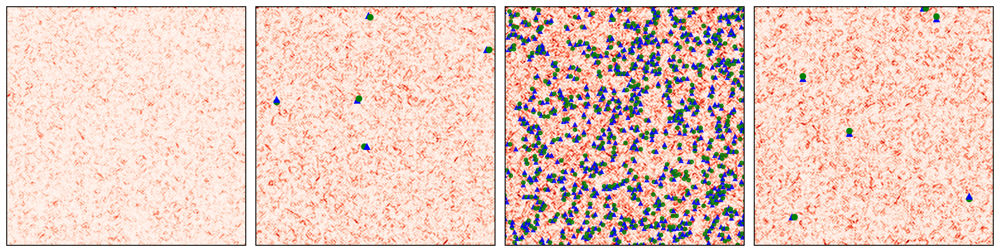

In [95]:

ncols = 4
w = 15 * ncols/4
wdens = .25
wframe = .25
fig, ax0 = plt.subplot_mosaic("ABCD",figsize=(w,4), width_ratios=[wdens, wframe, wframe, wframe], empty_sentinel=None)
ax = [ax0['A'], ax0['B'], ax0['C'], ax0['D']]

LX = ar.LX
LY = ar.LY
K = 0.05

for i, path in enumerate(paths[:]):

    frame = frame_list[i]
    Qxx_dat = frame.QQxx.reshape(LX, LY)
    Qyx_dat = frame.QQyx.reshape(LX, LY)
    S, nx, ny = mp.nematic.nematicPy.get_director(Qxx_dat, Qyx_dat)

    # Frank elastic energy
    dyQxx, dxQxx = np.gradient(Qxx_dat)
    dyQyx, dxQyx = np.gradient(Qyx_dat)
    E_el_val = K * 0.50 * 2 * ((dyQxx)**2 + (dxQxx)**2 + (dyQyx)**2 + (dxQyx)**2)

    im = ax[i].imshow(E_el_val.T, vmin=0., vmax=0.10,
                cmap='Reds', interpolation='lanczos', origin='lower')
    if i == 4:
        # Colorbar
        cbar = plt.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
        cbar.ax[i].tick_params(labelsize=12)
        cbar.set_label("Elastic Energy", fontsize=14)
        # Remove ticks

    if mode == 'dry':
        LXB, LYB = 12, 75
        Lstart = LXB
        Lend = LXB + LX/1.5 - 20
    elif mode == 'wet' and lambda_val == 1:
        LXB = 0 if i ==3 else 65
        LYB = 10 if i==3 else 0
        Lstart = LXB
        Lend = LXB + LX/1.35
    elif mode == 'wet' and lambda_val == 0:

        divisor=2 if i == 4 else 1.35
        LXB = 40 if i == 4 else 10
        LYB = 60 if i == 4 else 255 - 255 / divisor - LXB
        Lstart = LXB
       # divisor=1.5 if i == 3 else 1.35
        Lend = LXB + LX/divisor
    if i <5:
        print("lx_start, lx_end, delta: ", Lstart, Lend, Lend - Lstart)
        print("ly start, ly end ", Lstart + LYB, Lend + LYB, Lend - Lstart)

    if 0:
        if Lend - Lstart < 100:
            ms = 4
            alpha = 1
            avg = 1
            ms_dir, lw_dir, alpha_dir = 1.2, 1.2, .9
        elif Lend - Lstart < 175: 
            ms = 5 if mode == 'wet' else 6
            alpha = 1
            avg = 2
            ms_dir, lw_dir, alpha_dir = .8, 1, .8
        else: 
            ms = 4
            alpha = 1
            avg = 2
            ms_dir, lw_dir, alpha_dir = .8,1,.8
    if i == 2:
        alpha=.8
        ms=4
    else:
        alpha=1
        ms=6
    mp.nematic.plot.defects(frame, ax[i], ms = ms, alpha=alpha)
    ax[i].set(xlim=[Lstart,Lend], ylim=[Lstart + LYB,Lend + LYB], xticks=(), yticks=()); 

for AX in ax:  
    AX.xaxis.set_ticks_position('none') 
    AX.yaxis.set_ticks_position('none')
    if 0:
        AX.set_aspect('equal')  
    
if 0:
    for n, AXX in enumerate(ax):
        n0 = 0
        AXX.text(0, 1.05, rf'$\it{{({string.ascii_lowercase[n0 + n]})}}$', transform=AXX.transAxes,
                size=20,  weight='normal',fontstyle='italic',fontfamily="Times New Roman", color = 'black')

fig.tight_layout()
fig.savefig(os.path.join(figpath_article, f'elastic_frames_{mode}_lambda{lambda_val}dir.pdf'), dpi=620, bbox_inches='tight', pad_inches=.1)